**Introduction and data collection**

In [1]:
#importing packages
import pandas as pd
import numpy as np
import os
import tensorflow as tf
import json
#from google.colab import drive

In [2]:
import tensorflow as tf

# We'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
#import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import pandas as pd
import os
import time
import json
import collections
import operator
from glob import glob
from PIL import Image
import pickle
from numpy import array
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import numpy as np
from tensorflow import reshape
from tensorflow.keras import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Embedding, LSTM, Activation,ZeroPadding1D,Conv1D

print("Done imports")

Done imports


In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

# New Section

**Mounting drive for saving data**

In [4]:
#drive.mount('/content/drive/', force_remount=True) #mouting the drive

**Downloading COCO images**

**Downloading VQA Questions**

In [5]:
annotation_zip = tf.keras.utils.get_file('captions.zip',cache_subdir=os.path.abspath('.'),origin = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip',extract = True)

annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'

name_of_zip = 'train2014.zip'
if not os.path.exists(os.path.abspath('.')+'/' + name_of_zip):
  image_zip = tf.keras.utils.get_file(name_of_zip,cache_subdir=os.path.abspath('.'),origin='http://images.cocodataset.org/zips/train2014.zip',extract=True)
  PATH = os.path.dirname(image_zip)+'/train2014'
else:
  PATH = os.path.abspath('.')+'/train2014'  

In [6]:
print(PATH)
#!wget https://s3.amazonaws.com/cvmlp/vqs/mscoco/vqa/v2_Questions_Train_mscoco.zip
#!unzip -a v2_Questions_Train_mscoco.zip
!wget https://s3.amazonaws.com/cvmlp/vqa/mscoco/vqa/v2_Annotations_Train_mscoco.zip
!unzip -a v2_Annotations_Train_mscoco.zip
!wget https://s3.amazonaws.com/cvmlp/vqa/mscoco/vqa/v2_Questions_Train_mscoco.zip
!unzip -a v2_Questions_Train_mscoco.zip

/home/biplab/aakanksha/train2014
--2022-06-18 10:02:43--  https://s3.amazonaws.com/cvmlp/vqa/mscoco/vqa/v2_Annotations_Train_mscoco.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.81.163
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.81.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21708861 (21M) [application/zip]
Saving to: ‘v2_Annotations_Train_mscoco.zip.30’

v2_Annotations_Trai 100%[===================>]  20.70M  8.35MB/s    in 2.5s    

2022-06-18 10:02:46 (8.35 MB/s) - ‘v2_Annotations_Train_mscoco.zip.30’ saved [21708861/21708861]

Archive:  v2_Annotations_Train_mscoco.zip
replace v2_mscoco_train2014_annotations.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C
--2022-06-18 10:03:05--  https://s3.amazonaws.com/cvmlp/vqa/mscoco/vqa/v2_Questions_Train_mscoco.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.185.181
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.185.181|:443... connected.
HTTP request sent, await

In [7]:
# read the json file
question_file_path = 'v2_OpenEnded_mscoco_train2014_questions.json'
with open(question_file_path, 'r') as f:
    questions = json.load(f)

print("Total Number Questions is : ",len(questions['questions']))

Total Number Questions is :  443757


**Added code from separate image model**

In [8]:
#Storing the captions and image file name in vectors
import collections
import operator

annotation_file = 'v2_mscoco_train2014_annotations.json'

with open(annotation_file,'r') as f:
  annotations = json.load(f)



all_answers = []
all_answers_qids = []
all_img_name_vector = []

for annot in annotations['annotations']:
  #print(annot)
  ans_dic = collections.defaultdict(int)
  for each in annot['answers']:
    diffans = each['answer']
    if diffans in ans_dic:
      #print(each['answer_confidence'])
      if each['answer_confidence']=='yes':
        ans_dic[diffans]+=4
      if each['answer_confidence']=='maybe':
        ans_dic[diffans]+=2
      if each['answer_confidence']=='no':
        ans_dic[diffans]+=1
    else:
      if each['answer_confidence']=='yes':
        ans_dic[diffans]+=4
      if each['answer_confidence']=='maybe':
        ans_dic[diffans]+=2
      if each['answer_confidence']=='no':
        ans_dic[diffans]+=1

  #print(ans_dic)
  most_fav = max(ans_dic.items(),key=operator.itemgetter(1))[0]
  #print(most_fav)
  caption = '<start>' + most_fav + '<end>'  #each['answer']

  image_id = annot['image_id']
  question_id = annot['question_id']
  full_coco_image_path = PATH  + '/COCO_train2014_' + '%012d.jpg' %(image_id)

  all_img_name_vector.append(full_coco_image_path)
  all_answers.append(caption)
  all_answers_qids.append(question_id)










In [9]:
all_questions = []
question_ids = []
all_img_name_vector_2 = []


for annot in questions['questions']:
  caption = '<start>' + annot['question'] + '<end>'
  image_id = annot['image_id']
  full_coco_image_path = PATH + '/COCO_train2014_' + '%012d.jpg' %(image_id)
  
  all_img_name_vector_2.append(full_coco_image_path)
  all_questions.append(caption)
  #print(all_questions)
  question_ids.append(annot['question_id'])

In [10]:
print(questions['questions'][np.random.randint(0,443757)])#new ms coco code

{'image_id': 546800, 'question': 'What is the cat sitting in the car?', 'question_id': 546800002}


In [11]:
#Taken from separate image model
print(len(all_img_name_vector),len(all_answers),len(all_answers_qids))
print(all_img_name_vector[10:15],all_answers[10:15],all_answers_qids[10:15])
print(len(all_img_name_vector_2),len(all_questions),len(question_ids))
print(all_img_name_vector_2[10:15],all_questions[10:15],question_ids[10:15])

443757 443757 443757
['/home/biplab/aakanksha/train2014/COCO_train2014_000000393221.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393221.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393221.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393223.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393223.jpg'] ['<start>yes<end>', '<start>yes<end>', '<start>contrail<end>', '<start>yes<end>', '<start>white and purple<end>'] [393221000, 393221001, 393221002, 393223000, 393223001]
443757 443757 443757
['/home/biplab/aakanksha/train2014/COCO_train2014_000000393221.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393221.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393221.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393223.jpg', '/home/biplab/aakanksha/train2014/COCO_train2014_000000393223.jpg'] ['<start>Is the sky blue?<end>', '<start>Is there snow on the mountains?<end>', '<start>What is the white 

**Shuffling all questions and answers(taken from separate image model)**

In [12]:
train_answers,train_questions,img_name_vector = shuffle(all_answers,all_questions,all_img_name_vector,random_state=1)
#train_answers,train_questions,img_name_vector = (all_answers,all_questions,all_img_name_vector)
num_examples=50

train_answers = train_answers[:num_examples]
train_questions = train_questions[:num_examples]
img_name_vector =img_name_vector[:num_examples]

print(img_name_vector[0],train_questions[0],train_answers[0])
print(len(img_name_vector),len(train_questions),len(train_answers))

/home/biplab/aakanksha/train2014/COCO_train2014_000000573744.jpg <start>Is this a happy animal?<end> <start>yes<end>
50 50 50


**Downloading VQA Annotations**

In [13]:
annotation_file_path = 'v2_mscoco_train2014_annotations.json'
with open(annotation_file_path, 'r') as f:
    annotations = json.load(f)

In [14]:
annotations['annotations'][np.random.randint(0,443757)]

{'question_type': 'are these',
 'multiple_choice_answer': 'no',
 'answers': [{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 1},
  {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 2},
  {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 3},
  {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 4},
  {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 5},
  {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 6},
  {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 7},
  {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 8},
  {'answer': 'no', 'answer_confidence': 'maybe', 'answer_id': 9},
  {'answer': 'no', 'answer_confidence': 'maybe', 'answer_id': 10}],
 'image_id': 469137,
 'answer_type': 'yes/no',
 'question_id': 469137000}

In [15]:
#drive.mount('/content/drive/', force_remount=True)

**Data preprocessing**


In [16]:
#importing packages
import warnings
warnings.filterwarnings("ignore")

import os
import pandas as pd
import numpy as np
import json
import seaborn as sns
import tensorflow as tf

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from wordcloud import WordCloud
#from google.colab import drive

Populating the interactive namespace from numpy and matplotlib


**Variables**

**DATA TRANSFORMATION**
LOADING QUESTIONS AND ANSWERS

In [17]:
with open(question_file_path, 'r') as f:
    questions = json.load(f)
    questions = questions["questions"]

with open(annotation_file_path, 'r') as f:
    annotations = json.load(f)
    annotations = annotations["annotations"]

In [18]:
print("Total Number Questions is : ",len(questions))

Total Number Questions is :  443757


In [19]:
questions_df = pd.DataFrame(questions).sample(n=443757)
#questions_df = pd.DataFrame(questions)
#ques_samp = questions_df.sample(n=100)
#ques_samp.head(5)

questions_df.head(5)

,image_id,question,question_id
311171,90065,Can you see through the shower stall?,90065002
178946,443789,Does this animal look like it is smiling?,443789003
275076,341218,Are both doors open on the icebox?,341218001
280130,342724,What style of food is this?,342724000
352476,233902,What is the woman holding in her hand?,233902001


In [20]:
annotations_df = pd.DataFrame(annotations).sample(n=443757)
#annotations_df = pd.DataFrame(annotations)
#annot_samp = annotations_df.sample(n=100)
#annot_samp.head(5)
annotations_df.head(5)
print(len(annotations_df))

443757


**MERGING QUESTIONS AND ANNOTATIONS**

In [21]:
data = pd.merge(questions_df,annotations_df,  how='inner', left_on=['image_id','question_id'], right_on = ['image_id','question_id'])
#data_samp = pd.merge(ques_samp,annot_samp,  how='inner', left_on=['image_id','question_id'], right_on = ['image_id','question_id'])
print(len(data))


443757


In [22]:
data.head(5)
#data_samp.head(5)

,image_id,question,question_id,question_type,multiple_choice_answer,answers,answer_type
0,90065,Can you see through the shower stall?,90065002,can you,no,"[{'answer': 'no', 'answer_confidence': 'maybe'...",yes/no
1,443789,Does this animal look like it is smiling?,443789003,does this,no,"[{'answer': 'no', 'answer_confidence': 'yes', ...",yes/no
2,341218,Are both doors open on the icebox?,341218001,are,yes,"[{'answer': 'yes', 'answer_confidence': 'yes',...",yes/no
3,342724,What style of food is this?,342724000,what,sandwich,"[{'answer': 'sandwatch', 'answer_confidence': ...",other
4,233902,What is the woman holding in her hand?,233902001,what is the woman,pizza,"[{'answer': 'pizza', 'answer_confidence': 'yes...",other


In [23]:
#currentDirectory = "/content/drive/My Drive/pcase_study_2/"
#os.chdir(currentDirectory)
#currentDirectory = ""
#dataDirectory = currentDirectory + "data/"
#imageDirectory = dataDirectory + "train2014/"


#imageDirectory = '/content/train2014'    #comented for this remote cpu
#question_file_path = dataDirectory + 'v2_OpenEnded_mscoco_train2014_questions.json'



#question_file_path = '/content/v2_OpenEnded_mscoco_train2014_questions.json'     #comented for this remote cpu
#annotation_file_path = dataDirectory + 'v2_mscoco_train2014_annotations.json'



#annotation_file_path = '/content/v2_mscoco_train2014_annotations.json     #comented for this remote cpu

In [24]:
imageDirectory = '/home/biplab/aakanksha/train2014'
os.chdir(imageDirectory)
imageDirectory = ""

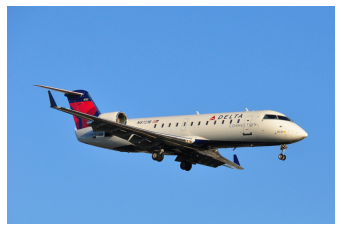

**************************************************
Question :  What kind of jet is this?
**************************************************
Answer :  delta
(425, 640, 3)


In [25]:
index = np.random.randint(0,len(data))#263115

img_path =  imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (data['image_id'][index])
img=mpimg.imread(img_path)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()
print("*"*50)
print("Question : " ,data['question'][index])
print("*"*50)
print("Answer : ", data['multiple_choice_answer'][index])

print(img.shape)

**IMAGES**

       image_id  question
0             9         3
1            25        18
2            30         6
3            34         3
4            36         3
...         ...       ...
82778    581903         3
82779    581904         6
82780    581906         3
82781    581909         4
82782    581921         4

[82783 rows x 2 columns]
82783
Max number of questions on a image 275
Min number of questions on a image 3
Mean of questions on a image 5.3604846405663


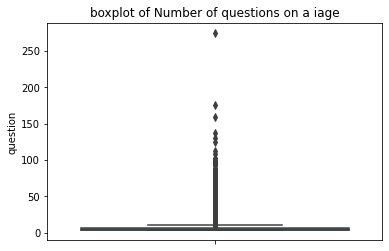

In [26]:
aggregations = {'question': 'count'}
temp = pd.DataFrame(data.groupby(['image_id'],as_index=False).agg(aggregations))
#temp.set_index('image_id', inplace=True)

print(temp)
print(len(temp))
num_of_ques_in_image = temp['question'].values
print("Max number of questions on a image",max(num_of_ques_in_image))
print("Min number of questions on a image",min(num_of_ques_in_image))
print("Mean of questions on a image",np.mean(num_of_ques_in_image))

ax = sns.boxplot(y = 'question', data = temp) 
plt.title("boxplot of Number of questions on a iage")
plt.show()

**IMAGES THAT HAVE MAXIMUM NUMBER OF QUESTIONS**

**Duplicate questions on same image**

In [27]:
aggregations = {'question_id':'count', 'multiple_choice_answer': lambda x: " || ".join(x)}
temp = pd.DataFrame(data.groupby(['image_id','question'],as_index=False).agg(aggregations)).rename(columns={'question_id':'count'})
temp = temp[temp['count']>1]
temp

,image_id,question,count,multiple_choice_answer
161,312,How many baby elephants are there?,2,1 || 1
1801,2614,What does the man in the blue shirt have in hi...,2,frisbee || frisbee
2035,3008,What color is the woman's hair?,2,brown || brown
8122,11065,What color is the horse?,2,brown || brown
12228,16414,What color is the parking meter?,2,black || black and yellow
...,...,...,...,...
416873,547471,What color is the man's suit?,2,black || black
422225,554455,What color is the clock?,2,gold || gold
426189,559619,What does the red sign say?,2,stop || stop
429722,564264,What is the dog carrying?,2,toy || toy


**Question type**

In [28]:
data.question_type.unique()

array(['can you', 'does this', 'are', 'what', 'what is the woman',
       'how many', 'is there a', 'is the', 'who is', 'what color are the',
       'what is the man', 'how many people are', 'do', 'what is',
       'none of the above', 'what color is the', 'is this',
       'where is the', 'what is the', 'are the', 'is', 'what kind of',
       'what does the', 'is this a', 'is that a', 'what number is', 'has',
       'why', 'what is this', 'are there', 'what type of', 'what are the',
       'are there any', 'is the man', 'what is on the', 'what color',
       'are they', 'does the', 'where are the', 'what sport is', 'how',
       'do you', 'what animal is', 'are these', 'what are',
       'what is in the', 'what room is', 'is he', 'is it', 'could',
       'why is the', 'which', 'is the person', 'what is the color of the',
       'was', 'is there', 'what is the person', 'what brand',
       'what color is', 'is this an', 'what is the name',
       'is this person', 'what time', 'is the 

In [29]:
print("Number of unique Question type in dataset : ",len(data.question_type.unique()))

Number of unique Question type in dataset :  65


In [30]:
def getFrequnctDict(data,column,isJoin=False):
    column_frequency = {}

    for _row in data[column]:
        if isJoin:
            _row = "_".join(_row.split())
        if(column_frequency.get(_row,-1) > 0):
            column_frequency[_row] += 1
        else:
            column_frequency[_row] = 1

    return column_frequency

def lineChart(data,column,top=20,isJoin=False):
    column_frequncy = getFrequnctDict(data,column,isJoin)
    sort_column_frequncy = sorted(list(column_frequncy.items()),key = lambda x: x[1],reverse=True)
    total_samples =  len(data)

    plt.plot([x[1]for x in sort_column_frequncy[:top]])
    i=np.arange(top)
    plt.title("Frequency of top " + str(top) + " " + column )
    plt.xlabel("Tags")
    plt.ylabel("Counts")
    plt.xticks(i,[x[0] for x in sort_column_frequncy[:top]])
    plt.xticks(rotation=90)
    plt.show()
    return sort_column_frequncy

def plotWordCloud(data,column,isJoin=False):
    column_frequncy = getFrequnctDict(data,column,isJoin)
    #https://www.geeksforgeeks.org/generating-word-cloud-python/
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = None, 
                    min_font_size = 10).generate_from_frequencies(column_frequncy)
    # plot the WordCloud image     
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title("WordCloud on "+ column)  
    plt.show()

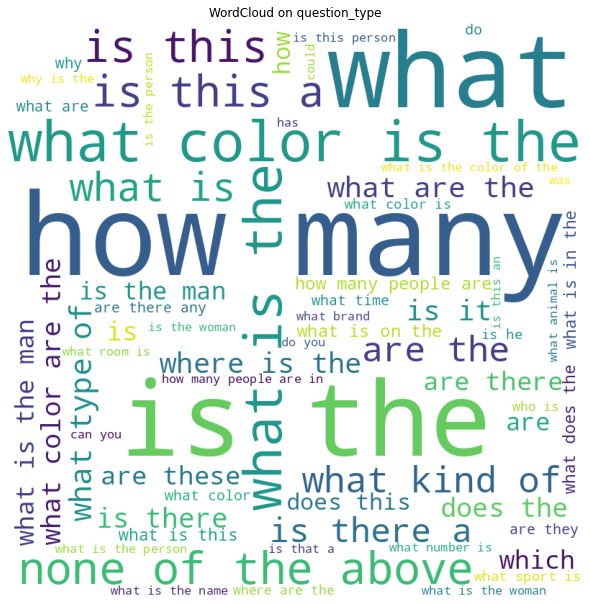

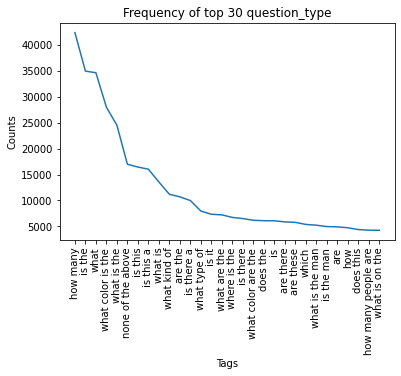

In [31]:
plotWordCloud(data, 'question_type')
question_type_frequncy = lineChart(data, 'question_type', top = 30)

In [32]:
for _type,_count in question_type_frequncy[:10]:
    print("Percentage of '" + _type + "' Type of Questions in Dataset is ", str(100*_count/len(data))) 

Percentage of 'how many' Type of Questions in Dataset is  9.541032592161926
Percentage of 'is the' Type of Questions in Dataset is  7.8707490811412555
Percentage of 'what' Type of Questions in Dataset is  7.7988628911769275
Percentage of 'what color is the' Type of Questions in Dataset is  6.301196375493795
Percentage of 'what is the' Type of Questions in Dataset is  5.521490365222408
Percentage of 'none of the above' Type of Questions in Dataset is  3.8248410729295537
Percentage of 'is this' Type of Questions in Dataset is  3.7056316858100264
Percentage of 'is this a' Type of Questions in Dataset is  3.610985291499627
Percentage of 'what is' Type of Questions in Dataset is  3.0559517934364977
Percentage of 'what kind of' Type of Questions in Dataset is  2.522101059814268


**ANSWERS**

In [33]:
data['answer_type'].unique()

array(['yes/no', 'other', 'number'], dtype=object)

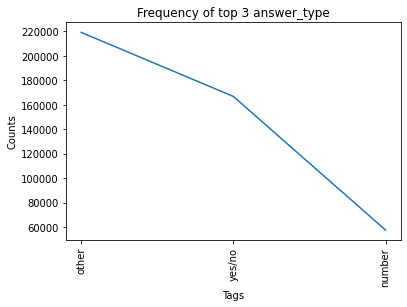

In [34]:
answer_type_frequncy = lineChart(data, 'answer_type', top = 3)

In [35]:
for _type,_count in answer_type_frequncy:
    print("Percentage of '" + _type + "' Type of Answers in Dataset is ", str(100*_count/len(data)) )

Percentage of 'other' Type of Answers in Dataset is  49.41195293820717
Percentage of 'yes/no' Type of Answers in Dataset is  37.60661803644788
Percentage of 'number' Type of Answers in Dataset is  12.981429025344953


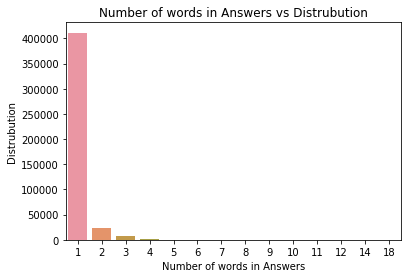

In [36]:
sns.countplot(data["multiple_choice_answer"].apply(lambda x: len(x.split())).values)
plt.title("Number of words in Answers vs Distrubution")
plt.xlabel("Number of words in Answers")
plt.ylabel("Distrubution")
plt.show()

**QUESTION**

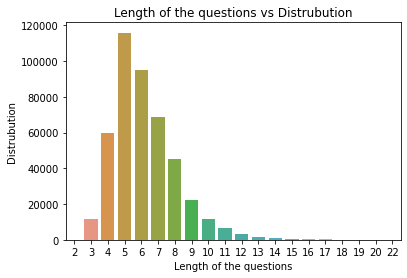

In [37]:
sns.countplot(data["question"].apply(lambda x: len(x.split())).values)
plt.title("Length of the questions vs Distrubution")
plt.xlabel("Length of the questions")
plt.ylabel("Distrubution")
plt.show()

**QUESTION TYPE AND ANSWER**

In [38]:
temp = data
top_question = [x[0] for x in question_type_frequncy[:50]]
print(top_question)
top_aswers = [x[0] for x in answer_type_frequncy[:50]]
print(top_aswers)
temp = data[(data['question_type'].isin(top_question) | data['multiple_choice_answer'].isin(top_aswers))]

aggregations = {'question': 'count'}
temp = pd.DataFrame(temp.groupby(['question_type','multiple_choice_answer'],as_index= False).agg(aggregations))
temp = temp[temp['question']>=10]
temp = temp.pivot(index='question_type', columns='multiple_choice_answer', values='question')
#print(temp)

['how many', 'is the', 'what', 'what color is the', 'what is the', 'none of the above', 'is this', 'is this a', 'what is', 'what kind of', 'are the', 'is there a', 'what type of', 'is it', 'what are the', 'where is the', 'is there', 'what color are the', 'does the', 'is', 'are there', 'are these', 'which', 'what is the man', 'is the man', 'are', 'how', 'does this', 'how many people are', 'what is on the', 'what does the', 'what is in the', 'what is this', 'why', 'what are', 'are they', 'what color', 'do', 'what time', 'are there any', 'what color is', 'is he', 'what sport is', 'where are the', 'who is', 'how many people are in', 'what animal is', 'is this an', 'do you', 'is the woman']
['other', 'yes/no', 'number']


**QUESTION TYPE VS ANSWER**

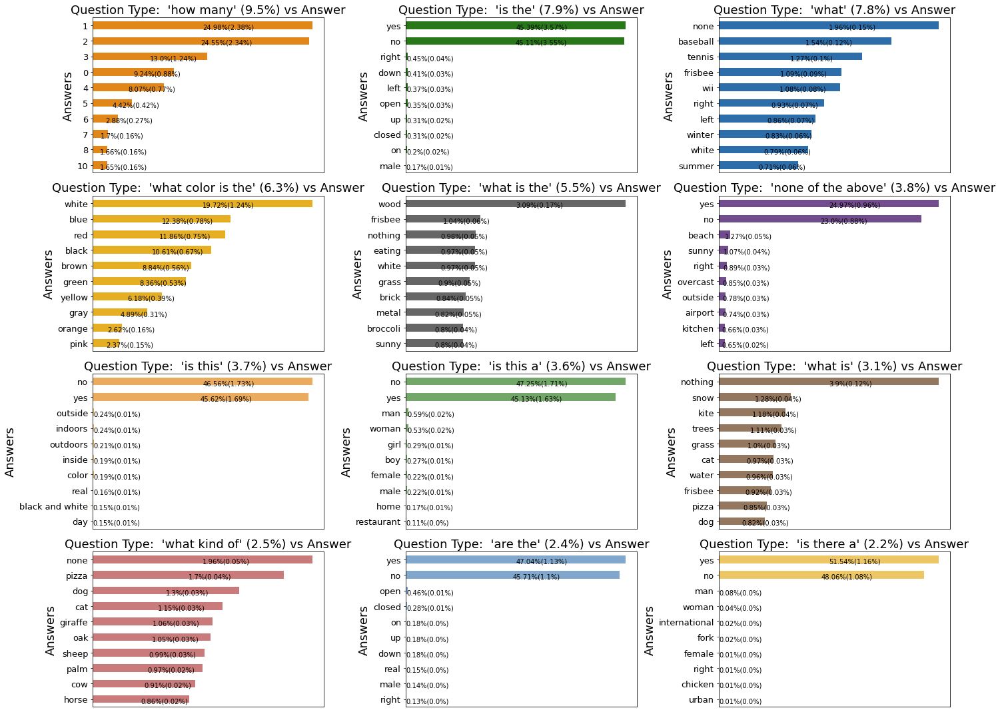

In [39]:
fig = plt.figure(figsize=(80,30))
fig.tight_layout() 
count = 1
colorCodes = [ "#E18719", "#287819", "#2D6EAA", "#E6AF23", "#666666","#724D8D", "#EAAB5E", "#73A769","#93785F",
              "#C97B7B", "#81A8CC", "#EDC765", "#858585","#957AA9", "#F3CFA3","#B4D0AF", "#BEADA0", "#E4BDBD", 
              "#ABC5DD", "#F4DB9C", "#A3A3A3"]

for _type,_ in question_type_frequncy[:12]:

    percentage = str(round((len(data[data['question_type']==_type])/len(data))*100,1))+'%'

    plt.subplot(4, 3, count)
    temp = data[data['question_type']==_type]
    ax = temp['multiple_choice_answer'].value_counts()[:10][::-1].plot(kind='barh', figsize=(20,15),color=colorCodes[count-1], fontsize=13)
    ax.set_alpha(0.8)   
    ax.set_title("Question Type:  '" + _type + "' (" + percentage + ") vs Answer" , fontsize=18)
    ax.set_ylabel("Answers", fontsize=18)
    ax.get_xaxis().set_visible(False)


    for i in ax.patches:
        ax.text(i.get_width()/2, i.get_y(), str(round((i.get_width()/len(temp))*100, 2))+'%' + "(" +
                str(round((i.get_width()/len(data))*100, 2))+'%' +")", fontsize=10,color='black')
        
    count += 1

fig.tight_layout()
plt.show()

**ANSWERS VS QUESTION TYPE**

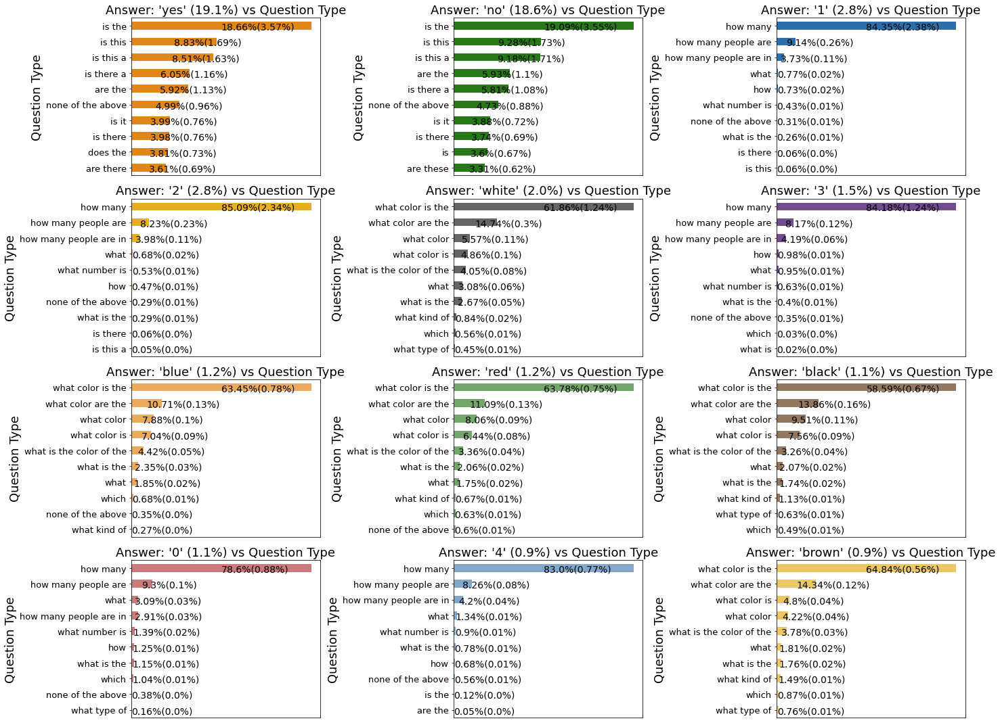

In [40]:
fig = plt.figure()
fig.tight_layout() 
count = 1

colorCodes = [ "#E18719", "#287819", "#2D6EAA", "#E6AF23", "#666666","#724D8D", "#EAAB5E", "#73A769","#93785F",
              "#C97B7B", "#81A8CC", "#EDC765", "#858585","#957AA9", "#F3CFA3","#B4D0AF", "#BEADA0", "#E4BDBD", 
              "#ABC5DD", "#F4DB9C", "#A3A3A3"]

answer_frequncy = sorted(list(getFrequnctDict(data,'multiple_choice_answer').items()),key = lambda x: x[1],reverse=True)

for _type,_ in answer_frequncy[:12]:

    percentage = str(round((len(data[data['multiple_choice_answer']==_type])/len(data))*100,1))+'%'

    plt.subplot(4, 3, count)
    temp = data[data['multiple_choice_answer']==_type]
    ax = temp['question_type'].value_counts()[:10][::-1].plot(kind='barh', figsize=(20,15),color=colorCodes[count-1], fontsize=13)
    ax.set_alpha(0.8)   
    ax.set_title("Answer: '" + _type + "' (" + percentage + ") vs Question Type" , fontsize=18)
    ax.set_ylabel("Question Type", fontsize=18)
    ax.get_xaxis().set_visible(False)

    for i in ax.patches:
        ax.text(i.get_width()/2, i.get_y(), str(round((i.get_width()/len(temp))*100, 2))+'%' + "(" +
                str(round((i.get_width()/len(data))*100, 2))+'%' +")", fontsize=14,color='black')
        
    count += 1

fig.tight_layout()
plt.show()

**CHECKING IF ACTUAL ANSWER IS SAME AS PERSONS ANSWERS**

In [41]:
def getPeopleAnswer(answers):
    answers_dict = {}
    score_dict = { 'yes' : 3, 'maybe' : 2, 'no' : 1 }
    for _answer in answers:
        score = score_dict[_answer['answer_confidence']]
        if answers_dict.get(_answer['answer'],-1) != -1 :
            answers_dict[_answer['answer']] += score
        else:
            answers_dict[_answer['answer']] = score

    return sorted(list(answers_dict.items()),key = lambda x: x[1],reverse=True)[0][0]

In [42]:
#data['derived_answer'] =  data["answers"].apply(lambda x: getPeopleAnswer(x))

In [43]:
#data[ data['derived_answer'] != data['multiple_choice_answer']]

In [44]:
!pwd

/home/biplab/aakanksha/train2014


In [45]:

dataDDirectory ='/home/biplab/aakanksha/newresults'
os.chdir(dataDDirectory)
!pwd
data.to_csv(dataDDirectory + 'data.csv')

/home/biplab/aakanksha/newresults


In [46]:
os.listdir(dataDDirectory)

['my_vqas_model',
 'VQAs_MODELvgg_WEIGHTS.hdf5',
 'Models',
 'validation.hdf5',
 'VQAs_MODEL_WEIGHTS.hdf5',
 'training.hdf5',
 'data',
 'my_vqasvgg_model',
 'filenamert.pickle',
 'my_vqasc_model',
 'VQAs_MODELc_WEIGHTS.hdf5',
 'myhdfff5.hdf5']

**Modelling**

In [47]:
import warnings
warnings.filterwarnings("ignore")

import pickle
import os
import pandas as pd
import random as rn
import numpy as np
import tensorflow as tf
#from google.colab import drive
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.regularizers import l1,l2
from tqdm import tqdm
import heapq
from sklearn.utils import shuffle
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from sklearn.model_selection import train_test_split

Populating the interactive namespace from numpy and matplotlib


**Variables**

In [48]:
currentDirectory = "/home/biplab/aakanksha/newresults/"
os.chdir(currentDirectory)
currentDirectory = ""
dataDirectory = currentDirectory + "data/"
#imageDirectory = dataDirectory + "train2014/"
imageDirectory = '/home/biplab/aakanksha/train2014/'
imageNumpyDirectory = dataDirectory + "train2014_Numpy" + ''

modelsDirectory = currentDirectory + "Models/"


img_width = 224
img_height = 224

BATCH_SIZE = 64
#BATCH_SIZE = 1
BUFFER_SIZE = 300

In [49]:
#len(os.listdir(imageNumpyDirectory))
data = pd.read_csv(dataDDirectory + 'data.csv')
X_train, X_val = train_test_split(data, test_size=0.2, random_state=42)

**Creating answer vectors**

In [50]:
contractions = { 
"ain't": "am not","aren't": "are not","can't": "cannot","can't've": "cannot have","'cause": "because","could've": "could have","couldn't": "could not",
"couldn't've": "could not have","didn't": "did not","doesn't": "does not","don't": "do not","hadn't": "had not","hadn't've": "had not have",
"hasn't": "has not","haven't": "have not","he'd": "he would","he'd've": "he would have","he'll": "he will","he's": "he is","how'd": "how did",
"how'll": "how will","how's": "how is","i'd": "i would","i'll": "i will","i'm": "i am","i've": "i have","isn't": "is not","it'd": "it would",
"it'll": "it will","it's": "it is","let's": "let us","ma'am": "madam","mayn't": "may not","might've": "might have","mightn't": "might not",
"must've": "must have","mustn't": "must not","needn't": "need not","oughtn't": "ought not","shan't": "shall not","sha'n't": "shall not","she'd": "she would",
"she'll": "she will","she's": "she is","should've": "should have","shouldn't": "should not","that'd": "that would","that's": "that is","there'd": "there had",
"there's": "there is","they'd": "they would","they'll": "they will","they're": "they are","they've": "they have","wasn't": "was not","we'd": "we would",
"we'll": "we will","we're": "we are","we've": "we have","weren't": "were not","what'll": "what will","what're": "what are","what's": "what is",
"what've": "what have","where'd": "where did","where's": "where is","who'll": "who will","who's": "who is","won't": "will not","wouldn't": "would not",
"you'd": "you would","you'll": "you will","you're": "you are"
}

def preprocess_english(text):
    '''Given a text this function removes the punctuations and returns the remaining text string'''
    new_text = ""
    text = text.lower()
    i = 0
    for word in text.split():
      if i==0:
        new_text = contractions.get(word,word)
      else:
        new_text = new_text + " " + contractions.get(word,word)
      i += 1
    return new_text.replace("'s", '')

In [51]:
X_train['multiple_choice_answer'] = X_train['multiple_choice_answer'].apply(lambda x: preprocess_english(x))
X_val['multiple_choice_answer'] = X_val['multiple_choice_answer'].apply(lambda x: preprocess_english(x))

In [52]:
all_classes = X_train['multiple_choice_answer'].values
class_frequency = {}

for _cls in all_classes:
    if(class_frequency.get(_cls,-1)>0):
        class_frequency[_cls] += 1
    else:
        class_frequency[_cls] = 1

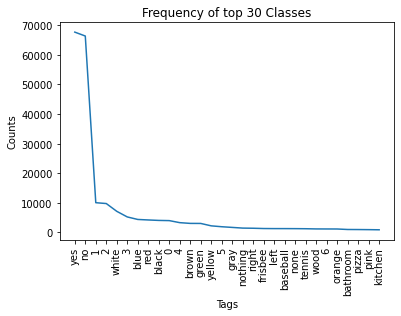

In [53]:
sort_class_frequency = sorted(list(class_frequency.items()),key = lambda x: x[1],reverse=True)   

plt.plot([x[1] for x in sort_class_frequency[:30]])
i=np.arange(30)
plt.title("Frequency of top 30 Classes")
plt.xlabel("Tags")
plt.ylabel("Counts")
plt.xticks(i,[x[0] for x in sort_class_frequency[:30]])
plt.xticks(rotation=90)
plt.show()

5 most frequent Classes covers 45.34% points
10 most frequent Classes covers 51.49% points
20 most frequent Classes covers 57.29% points
50 most frequent Classes covers 64.04% points
70 most frequent Classes covers 66.60% points
100 most frequent Classes covers 69.50% points
200 most frequent Classes covers 75.35% points
500 most frequent Classes covers 82.92% points
750 most frequent Classes covers 85.71% points
1000 most frequent Classes covers 87.52% points
2000 most frequent Classes covers 91.30% points
3000 most frequent Classes covers 93.18% points
5000 most frequent Classes covers 95.20% points


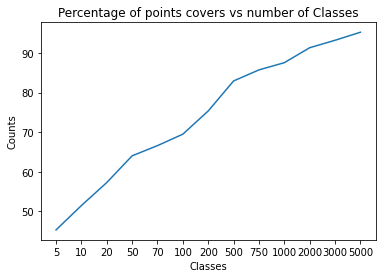

In [54]:
def getPercentageOfDataCoversGivenNumClasses(n_class, class_frequency, df):
    n_common_class = heapq.nlargest(n_class, class_frequency, key=class_frequency.get)
    count = 0
    for _class in df['multiple_choice_answer'].values:
        if(_class in n_common_class):
            count += 1

    return (count/len(df))*100
    
n_classes = [5,10,20,50,70,100,200,500,750,1000,2000,3000,5000]
percentage_cover = []
for i in n_classes:
    temp = getPercentageOfDataCoversGivenNumClasses(i,class_frequency,X_train)
    percentage_cover.append(temp)
    print("{} most frequent Classes covers {:.2f}% points".format(i,temp))


plt.plot(percentage_cover)
i=np.arange(len(percentage_cover))
plt.title("Percentage of points covers vs number of Classes")
plt.xlabel("Classes")
plt.ylabel("Counts")
plt.xticks(i,n_classes)
plt.show()

In [55]:
common_tags = heapq.nlargest(1000, class_frequency, key = class_frequency.get)
X_train['multiple_choice_answer'] =  X_train['multiple_choice_answer'].apply(lambda x: x if x in common_tags else '')

#removing question which has empty tags
X_train = X_train[X_train['multiple_choice_answer'].apply(lambda x: len(x)>0)]

In [56]:
label_encoder = LabelBinarizer()
answer_vector_train = label_encoder.fit_transform(X_train['multiple_choice_answer'].apply(lambda x: x).values)
answer_vector_val = label_encoder.transform(X_val['multiple_choice_answer'].apply(lambda x: x).values)

ans_vocab = {l: i for i, l in enumerate(label_encoder.classes_)}

print("Number of clasess: ", len(ans_vocab))
print("Shape of Answer Vectors in Train Data: ", answer_vector_train.shape)
print("Shape of Answer Vectors in Validation Data: ", answer_vector_val.shape)

Number of clasess:  1000
Shape of Answer Vectors in Train Data:  (310712, 1000)
Shape of Answer Vectors in Validation Data:  (88752, 1000)


**Creating Image features using VGG19**

In [120]:
import pickle
import keras
from keras.models import Sequential,Model
from keras.layers import Input
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import LeakyReLU
import tensorflow as tf
from tensorflow import keras
import keras.layers as layers
import math
from tensorflow import keras
#from tensorflow.keras import layers

def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    print("img after channels shape")
    print(img.shape)
    img = tf.image.resize(img, (img_width, img_height))
    print("img after resize shape")
    print(img.shape)
    
    #img = tf.keras.applications.vgg19.preprocess_input(img)
    img = img * (1./255)
    return img, image_path


def smallvgg_Top():
  
  modely = Sequential()
  modely.add(Conv2D(input_shape=(224,224,3),filters=64,kernel_size=(3,3),padding="same", activation="relu"))
  modely.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  modely.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  #modely.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  #model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  #modely.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  #modely.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
  #modely.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
  #modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  #modely.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  return modely
  
    


    

def generateImageFeatures(images):
    model = smallvgg_Top()
    all_image_dict = {}
  
    img_ds = tf.data.Dataset.from_tensor_slices(images)
    img_ds = img_ds.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)
    
    for batch_img, batch_path in img_ds:
        batch_img_features = model(batch_img)
        #print(batch_img_features)

        for img_features, path in zip(batch_img_features, batch_path):
            image_path = path.numpy().decode("utf-8")
            print(image_path)
            
            
            #image_path = image_path.replace(imageDirectory,'/content/drive/MyDrive/newresults/data'+'/'+'train2014_Numpy').replace('.jpg',"")
            image_path = image_path.replace(imageDirectory,imageNumpyDirectory).replace('.jpg',"")
            print(image_path)
            np.save(image_path, img_features.numpy())
            all_image_dict[image_path] = img_features.numpy()
            print("Printing image features")
            #print(all_image_dict[image_path])
    
    with open('filenamert.pickle', 'wb') as handle:
        pickle.dump(all_image_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
        
    return

!pwd
all_image_path = data['image_id'].apply(lambda x:  imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (x)).unique()

  


generateImageFeatures(all_image_path)

/home/biplab/aakanksha/newresults
img after channels shape
(None, None, 3)
img after resize shape
(224, 224, 3)
/home/biplab/aakanksha/train2014/COCO_train2014_000000090065.jpg
data/train2014_NumpyCOCO_train2014_000000090065
Printing image features
/home/biplab/aakanksha/train2014/COCO_train2014_000000443789.jpg
data/train2014_NumpyCOCO_train2014_000000443789
Printing image features
/home/biplab/aakanksha/train2014/COCO_train2014_000000341218.jpg
data/train2014_NumpyCOCO_train2014_000000341218
Printing image features
/home/biplab/aakanksha/train2014/COCO_train2014_000000342724.jpg
data/train2014_NumpyCOCO_train2014_000000342724
Printing image features
/home/biplab/aakanksha/train2014/COCO_train2014_000000233902.jpg
data/train2014_NumpyCOCO_train2014_000000233902
Printing image features
/home/biplab/aakanksha/train2014/COCO_train2014_000000351610.jpg
data/train2014_NumpyCOCO_train2014_000000351610
Printing image features
/home/biplab/aakanksha/train2014/COCO_train2014_000000149892.jpg
d

In [121]:
  modely = Sequential()
  modely.add(Conv2D(input_shape=(224,224,3),filters=64,kernel_size=(3,3),padding="same", activation="relu"))
  modely.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  modely.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  #modely.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  #model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  #modely.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  #modely.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
  #modely.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
  #modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  #modely.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
#model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
  modely.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  modely.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_44 (Conv2D)          (None, 224, 224, 64)      1792      
                                                                 
 conv2d_45 (Conv2D)          (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 112, 112, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_46 (Conv2D)          (None, 112, 112, 128)     73856     
                                                                 
 max_pooling2d_36 (MaxPoolin  (None, 56, 56, 128)      0         
 g2D)                                                            
                                                                 
 max_pooling2d_37 (MaxPoolin  (None, 28, 28, 128)     

In [122]:
'''model = keras.Sequential()
    model.add(layers.Conv2D(filters=96, kernel_size=(11, 11), 
                        strides=(4, 4), activation="relu", 
                        input_shape=(227, 227, 3)))

    model.add(layers.BatchNormalization())
    model.add(layers.MaxPool2D(pool_size=(3, 3), strides= (2, 2)))
    model.add(layers.Conv2D(filters=256, kernel_size=(5, 5), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPool2D(pool_size=(3, 3), strides=(2, 2)))
    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(filters=256, kernel_size=(3, 3), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPool2D(pool_size=(3, 3), strides=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(86, activation="relu"))
    model.add(layers.Dropout(0.5))
    
    return model'''

'model = keras.Sequential()\n    model.add(layers.Conv2D(filters=96, kernel_size=(11, 11), \n                        strides=(4, 4), activation="relu", \n                        input_shape=(227, 227, 3)))\n\n    model.add(layers.BatchNormalization())\n    model.add(layers.MaxPool2D(pool_size=(3, 3), strides= (2, 2)))\n    model.add(layers.Conv2D(filters=256, kernel_size=(5, 5), \n                        strides=(1, 1), activation="relu", \n                        padding="same"))\n    model.add(layers.BatchNormalization())\n    model.add(layers.MaxPool2D(pool_size=(3, 3), strides=(2, 2)))\n    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), \n                        strides=(1, 1), activation="relu", \n                        padding="same"))\n    model.add(layers.BatchNormalization())\n    model.add(layers.Conv2D(filters=384, kernel_size=(3, 3), \n                        strides=(1, 1), activation="relu", \n                        padding="same"))\n    model.add(layers.Batch

In [123]:
print(imageDirectory)

/home/biplab/aakanksha/train2014/


In [124]:
image_paths_train = X_train['image_id'].apply(lambda x:  imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (x)).values
image_paths_val = X_val['image_id'].apply(lambda x:  imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (x)).values
#print(image_paths_train)
with open('filenamert.pickle','rb') as handle:
    all_image_dict = pickle.load(handle)

#with open('all_image_dict_new.pickle', 'rb') as handle:
    #all_image_dict_new = pickle.load(handle)

all_image_dict.update(all_image_dict)
#del all_image_dict_new

In [125]:
print(type(image_paths_train))

<class 'numpy.ndarray'>


**Creating question vectors**

In [126]:
def preprocess_english(text):
    '''Given a text this function removes the punctuations and returns the remaining text string'''
    new_text = "<start>"
    text = text.lower()
    for word in text.split():
      new_text = new_text + " " + contractions.get(word,word)
    new_text = new_text + " <end>"
    return new_text.replace("'s", '')

In [127]:
X_train['question'] = X_train['question'].apply(lambda x: preprocess_english(x))
X_val['question'] = X_val['question'].apply(lambda x: preprocess_english(x))

In [128]:
#tokenization
tokenizer = tf.keras.preprocessing.text.Tokenizer(oov_token = "<unk>", filters = '!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(X_train['question'].values)
train_question_seqs = tokenizer.texts_to_sequences(X_train['question'].values)
val_question_seqs = tokenizer.texts_to_sequences(X_val['question'].values)

print("Number of words in tokenizer:", len(tokenizer.word_index))
ques_vocab = tokenizer.word_index

#Padding
#tokenizer.word_index['<pad>'] = 0
#tokenizer.index_word[0] = '<pad>'
question_vector_train = tf.keras.preprocessing.sequence.pad_sequences(train_question_seqs, padding='post')
question_vector_val = tf.keras.preprocessing.sequence.pad_sequences(val_question_seqs,padding='post',maxlen=question_vector_train.shape[1])

print("Shape of Question Vectors in Train Data: ", question_vector_train.shape)
print("Shape of Question Vectors in Validation Data: ", question_vector_val.shape)

Number of words in tokenizer: 11982
Shape of Question Vectors in Train Data:  (310712, 27)
Shape of Question Vectors in Validation Data:  (88752, 27)


**Creating dataset**

In [129]:
def get_imageTensor(img, ques):
    path = img.decode('utf-8').replace(imageDirectory,'/home/biplab/aakanksha/newresults/data'+'/'+'train2014_Numpy').replace('.jpg',"") +'.npy'
    
    img_tensor = np.load(path)
    #img_tensor = all_image_dict[img.decode('utf-8')]
    
    return img_tensor, ques

In [130]:
def createDataset(image_paths,question_vector,answer_vector):
    dataset_input = tf.data.Dataset.from_tensor_slices((image_paths, question_vector.astype(np.float32)))
    dataset_output = tf.data.Dataset.from_tensor_slices((answer_vector.astype(np.float32)))
    # using map to load the numpy files in parallel
    dataset_input = dataset_input.map(lambda img, ques : tf.numpy_function(get_imageTensor, [img, ques], [tf.float32, tf.float32]),
                                      num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # shuffling and batching
    #dataset_input = dataset_input.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
    dataset_input = dataset_input.batch(BATCH_SIZE)
    
    dataset_output = dataset_output.batch(BATCH_SIZE)#.repeat()
    
    dataset = tf.data.Dataset.zip((dataset_input, dataset_output))
    dataset = dataset.prefetch(buffer_size = tf.data.experimental.AUTOTUNE)

    return dataset

In [131]:
dataset_train = createDataset(image_paths_train, question_vector_train, answer_vector_train)
dataset_val = createDataset(image_paths_val, question_vector_val, answer_vector_val)
print(dataset_train)

<PrefetchDataset element_spec=((TensorSpec(shape=<unknown>, dtype=tf.float32, name=None), TensorSpec(shape=<unknown>, dtype=tf.float32, name=None)), TensorSpec(shape=(None, 1000), dtype=tf.float32, name=None))>


In [132]:
print(type(dataset_train))
print(dataset_train)

<class 'tensorflow.python.data.ops.dataset_ops.PrefetchDataset'>
<PrefetchDataset element_spec=((TensorSpec(shape=<unknown>, dtype=tf.float32, name=None), TensorSpec(shape=<unknown>, dtype=tf.float32, name=None)), TensorSpec(shape=(None, 1000), dtype=tf.float32, name=None))>


In [133]:
hdf5_dict = {
    
    "train_images": image_paths_train,
    "train_ques": question_vector_train.astype(np.float32),
    "train_ans": answer_vector_train.astype(np.float32)
}

In [134]:
print(type(dataset_train))

<class 'tensorflow.python.data.ops.dataset_ops.PrefetchDataset'>


In [135]:
!pip install h5py

In [136]:
import h5py

In [137]:
!pwd

/home/biplab/aakanksha/newresults


In [138]:
# create HDF5 file
with h5py.File('myhdfff5.hdf5', 'w') as hf:
    ls = list(hf.keys())
    print('list of dataset in this file: \n',ls)
    dt = h5py.special_dtype(vlen = np.dtype('float64'))
    dset_x_imgtrain = hf.create_dataset('imgg_train', data=image_paths_train)
    print(dset_x_imgtrain)
    dset_x_questrain = hf.create_dataset('quess_train', data=question_vector_train)
    dset_x_anstrain = hf.create_dataset('anss_train', data=answer_vector_train)
    '''for each in dset_x_anstrain:
      print(each)'''
    

list of dataset in this file: 
 []
<HDF5 dataset "imgg_train": shape (310712,), type "|O">


In [139]:
# create HDF5 file
with h5py.File('training.hdf5', 'w') as hf:
    ls = list(hf.keys())
    print('list of dataset in this file: \n',ls)
    dt = h5py.special_dtype(vlen = np.dtype('float64'))
    dset_x_imgtrain = hf.create_dataset('imgg_train', data=image_paths_train)
    print(dset_x_imgtrain)
    dset_x_questrain = hf.create_dataset('quess_train', data=question_vector_train)
    dset_x_anstrain = hf.create_dataset('anss_train', data=answer_vector_train)

list of dataset in this file: 
 []
<HDF5 dataset "imgg_train": shape (310712,), type "|O">


In [140]:
# create HDF5 file
with h5py.File('training.hdf5', 'r') as hf:
    ls = list(hf.keys())
    print('list of dataset in this file: \n',ls)
    img_data = hf.get('imgg_train')
    img_data1 = np.array(img_data)
    print(img_data1.shape)
    ques_data = hf.get('quess_train')
    ques_data1 = np.array(ques_data)
    print(ques_data1.shape)
    anss_data = hf.get('anss_train')
    anss_data1 = np.array(anss_data)
    print(anss_data1.shape)
    
    

list of dataset in this file: 
 ['anss_train', 'imgg_train', 'quess_train']
(310712,)
(310712, 27)
(310712, 1000)


In [141]:
# create HDF5 file
with h5py.File('validation.hdf5', 'w') as hf:
    ls = list(hf.keys())
    print('list of dataset in this file: \n',ls)
    dt = h5py.special_dtype(vlen = np.dtype('float64'))
    dset_x_imgval = hf.create_dataset('imgg_val', data=image_paths_val)
    print(dset_x_imgtrain)
    dset_x_quesval = hf.create_dataset('quess_val', data=question_vector_val)
    dset_x_ansval = hf.create_dataset('anss_val', data=answer_vector_val)

list of dataset in this file: 
 []
<Closed HDF5 dataset>


In [142]:
print(dset_x_anstrain)

<Closed HDF5 dataset>


**Baseline Model**

In [143]:
##fixing numpy RS
np.random.seed(42)

##fixing tensorflow RS
tf.random.set_seed(32)

##python RS
rn.seed(12)

In [144]:
!pip install tensorflow-addons==0.8.3
!pip install tensorflow==2.2.0-rc3

ERROR: Could not find a version that satisfies the requirement tensorflow==2.2.0-rc3 (from versions: 1.13.1, 1.13.2, 1.14.0, 1.15.0, 1.15.2, 1.15.3, 1.15.4, 1.15.5, 2.0.0, 2.0.1, 2.0.2, 2.0.3, 2.0.4, 2.1.0, 2.1.1, 2.1.2, 2.1.3, 2.1.4, 2.2.0, 2.2.1, 2.2.2, 2.2.3, 2.3.0, 2.3.1, 2.3.2, 2.3.3, 2.3.4, 2.4.0, 2.4.1, 2.4.2, 2.4.3, 2.4.4, 2.5.0, 2.5.1, 2.5.2, 2.5.3, 2.6.0rc0, 2.6.0rc1, 2.6.0rc2, 2.6.0, 2.6.1, 2.6.2, 2.6.3, 2.6.4, 2.6.5, 2.7.0rc0, 2.7.0rc1, 2.7.0, 2.7.1, 2.7.2, 2.7.3, 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1)
ERROR: No matching distribution found for tensorflow==2.2.0-rc3


In [145]:
import tensorflow_addons as tfa

In [ ]:

l2_alpha = 0.001
ModelName = "BaselineModel"
modelb = Build_BaseModel()
modelb.summary()
model_vqa = modelb.save('VQAs_MODEL_WEIGHTS.hdf5')
mode_save = modelb.save('my_vqas_model')

#model.fit(train_ddata, epochs = 1, callbacks = callBacksList())
#model.fit(train_ddata, epochs = 1, validation_data = dataset_val, callbacks = callBacksList())

In [150]:
def callBacksList():
    """
    returns list of callback's
    """
    filepath = modelsDirectory + ModelName + "/best.hdf5"
    checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = filepath, monitor = 'val_accuracy', verbose = 1, save_best_only = True, mode = 'auto')
    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy', patience = 3)
    early_stop = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy', patience = 4, verbose = 1)

    #directory for tensorboard to save evnts
    log_dir= modelsDirectory + "logs/fit/" + ModelName + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    os.makedirs(log_dir)

    print("TensorBoard Folder for this Execution",log_dir)#creating TensorBoard call back,this will write all events to given folder
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = log_dir, histogram_freq = 1)

    history = tf.keras.callbacks.History()
    callbacks_list = [reduce_lr, early_stop, history, tensorboard_callback, checkpoint]
    return callbacks_list

def Buildd_BaseModel():
    image_input = tf.keras.layers.Input(shape=(14,14,128))
    #image_input = tf.keras.layers.Input(shape=(1000,))
    #image_input = tf.expand_dims(image_input,axis=0)
    question_input = tf.keras.layers.Input(shape=(question_vector_train.shape[1],))

    image_conv_layer1 = tf.keras.layers.Conv2D(filters = 1024, kernel_size = 7 , strides = 1, padding = "valid", activation = 'relu',
                                               kernel_initializer = tf.keras.initializers.he_normal(seed=45))(image_input)

    image_flatten = tf.keras.layers.Flatten()(image_conv_layer1)

    image_dense_1 = tf.keras.layers.Dense(1024, activation = tf.nn.relu, 
                                          kernel_initializer = tf.keras.initializers.he_uniform(seed=54))(image_flatten)
    
    image_dense_2 = tf.keras.layers.Dense(1024, activation = tf.nn.relu, 
                                          kernel_initializer = tf.keras.initializers.he_uniform(seed=32))(image_dense_1)


    # Input 2 Pathway
    question_emb = tf.keras.layers.Embedding(input_dim = len(tokenizer.word_index) + 1, output_dim = 300 ,name = "Embedding_Layer",
                                             embeddings_initializer = tf.keras.initializers.RandomNormal(mean=0, stddev=1, seed=23))(question_input)

    question_lstm = tf.keras.layers.LSTM(1024, 
                                         kernel_initializer = tf.keras.initializers.glorot_uniform(seed=26),
                                         recurrent_initializer = tf.keras.initializers.orthogonal(seed=54),
                                         bias_initializer=tf.keras.initializers.zeros())(question_emb)

    question_flatten = tf.keras.layers.Flatten(name="Flatten_lstm")(question_lstm)

    
    image_question = tf.keras.layers.Multiply()([image_dense_2, question_flatten])


    image_question_dense_1 = tf.keras.layers.Dense(1000, activation = tf.nn.relu,
                                                    kernel_initializer = tf.keras.initializers.he_uniform(seed=19))(image_question)
    
    image_question_dense_2 = tf.keras.layers.Dense(1000, activation = tf.nn.relu, 
                                                   kernel_initializer = tf.keras.initializers.he_uniform(seed=28))(image_question_dense_1)

    output = tf.keras.layers.Dense(len(ans_vocab), activation=tf.nn.softmax, 
                                   kernel_initializer = tf.keras.initializers.glorot_normal(seed=15))(image_question_dense_2)

    # Create Model
    modeld = tf.keras.models.Model(inputs = [image_input, question_input], outputs = output)
    # Compile
    #modeld.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    modeld.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy',keras.metrics.Precision(), keras.metrics.Recall()])
    return modeld

In [151]:

l2_alpha = 0.001
ModelName = "BaselineModel"
modeld = Buildd_BaseModel()
modeld.summary()
model_vqa = modeld.save('VQAs_MODELvgg_WEIGHTS.hdf5')
model_save = modeld.save('my_vqasvgg_model')

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 14, 14, 128  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_48 (Conv2D)             (None, 8, 8, 1024)   6423552     ['input_9[0][0]']                
                                                                                                  
 input_10 (InputLayer)          [(None, 27)]         0           []                               
                                                                                                  
 flatten_4 (Flatten)            (None, 65536)        0           ['conv2d_48[0][0]']        

INFO:tensorflow:Assets written to: my_vqasvgg_model/assets


INFO:tensorflow:Assets written to: my_vqasvgg_model/assets


In [152]:
'''import time
begin = time.time()
history = modelb.fit(dataset_train, epochs = 20, validation_data = dataset_val, callbacks = callBacksList())
time.sleep(1)
end = time.time()
print(f"Total runtime of the program is {end - begin}")'''

'import time\nbegin = time.time()\nhistory = modelb.fit(dataset_train, epochs = 20, validation_data = dataset_val, callbacks = callBacksList())\ntime.sleep(1)\nend = time.time()\nprint(f"Total runtime of the program is {end - begin}")'

In [153]:
import time
begin = time.time()
history = modeld.fit(dataset_train, epochs = 20, validation_data = dataset_val, callbacks = callBacksList())
time.sleep(1)
end = time.time()
print(f"Total runtime of the program is {end - begin}")

TensorBoard Folder for this Execution Models/logs/fit/BaselineModel/20220619-000330
Epoch 1/20
4855/4855 [==============================] - ETA: 0s - loss: 2.6968 - accuracy: 0.2916 - precision_3: 0.4978 - recall_3: 0.1993
Epoch 1: val_accuracy improved from -inf to 0.28314, saving model to Models/BaselineModel/best.hdf5
4855/4855 [==============================] - 3290s 677ms/step - loss: 2.6968 - accuracy: 0.2916 - precision_3: 0.4978 - recall_3: 0.1993 - val_loss: 1.9875 - val_accuracy: 0.2831 - val_precision_3: 0.5070 - val_recall_3: 0.1977 - lr: 0.0010
Epoch 2/20
4855/4855 [==============================] - ETA: 0s - loss: 2.1582 - accuracy: 0.3315 - precision_3: 0.5051 - recall_3: 0.2238
Epoch 2: val_accuracy improved from 0.28314 to 0.30467, saving model to Models/BaselineModel/best.hdf5
4855/4855 [==============================] - 3282s 676ms/step - loss: 2.1582 - accuracy: 0.3315 - precision_3: 0.5051 - recall_3: 0.2238 - val_loss: 1.8188 - val_accuracy: 0.3047 - val_precision

In [154]:
#modelb.fit(dataset_train, epochs = 20, callbacks = callBacksList())
#history = modelb.fit(dataset_train, epochs = 20, validation_data = dataset_val, callbacks = callBacksList())
#model.fit(dataset_train, epochs = 2, validation_data = dataset_val, callbacks = callBacksList())

In [155]:
recons_model = tf.keras.models.load_model('/home/biplab/aakanksha/newresults/my_vqasvgg_model')

In [156]:
recons_model.load_weights('/home/biplab/aakanksha/newresults/VQAsvgg_MODEL_WEIGHTS.hdf5')
#recons_model.evaluate(dataset_val)

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '/home/biplab/aakanksha/newresults/VQAsvgg_MODEL_WEIGHTS.hdf5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [2]:
import matplotlib.pyplot as plt

In [4]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

NameError: name 'history' is not defined

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
'''%load_ext tensorboard
%tensorboard --logdir Models/logs/fit/BaselineModel'''

**TESTING**

In [ ]:
#model.load_weights(modelsDirectory + ModelName + "/best.hdf5")
test_idx = np.random.randint(len(X_val), size = 3)
model_vgg = Alex_Top()
k = 10

for idx in test_idx:
    test_image_id = X_val['image_id'].values[idx]
    test_question = X_val['question'].values[idx]
    actual_answer = X_val['multiple_choice_answer'].values[idx]
    test_image_path = imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (test_image_id)

    test_image_features = model_vgg(tf.expand_dims(load_image(test_image_path)[0], 0))
    test_question_features = tf.keras.preprocessing.sequence.pad_sequences(tokenizer.texts_to_sequences([test_question]),padding='post',
                                                                           maxlen=question_vector_train.shape[1])
    y_pred = recons_model.predict([test_image_features,test_question_features])

    class_indices = tf.math.top_k(y_pred,k=k).indices.numpy()
    percentages = tf.math.top_k(y_pred,k=k).values.numpy()[0] * 100
    predictions = []
    for idx,i in enumerate(class_indices[0]):
        classes = np.zeros((1,1000))
        classes[0][i] = 1
        predictions.append((label_encoder.inverse_transform(classes)[0],percentages[idx]))

    img=mpimg.imread(test_image_path)
    imgplot = plt.imshow(img)
    plt.axis('off')
    plt.show()

    print("Question :", test_question.replace("<start> ","").replace(" <end>",""))
    print("Actual Answer: ", actual_answer)
    print("Top Predicted answers: ",predictions)
    print("*"*150)
    

In [ ]:
test_idx = np.random.randint(len(X_val), size = 10)
model_vgg = Alex_Top()
k = 5

for idx in test_idx:
    test_image_id = X_val['image_id'].values[idx]
    test_question = X_val['question'].values[idx]
    actual_answer = X_val['multiple_choice_answer'].values[idx]
    test_image_path = imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (test_image_id)

    test_image_features = model_vgg(tf.expand_dims(load_image(test_image_path)[0], 0))
    test_question_features = tf.keras.preprocessing.sequence.pad_sequences(tokenizer.texts_to_sequences([test_question]),padding='post',
                                                                           maxlen=question_vector_train.shape[1])
    y_pred = recons_model.predict([test_image_features,test_question_features])

    class_indices = tf.math.top_k(y_pred,k=k).indices.numpy()
    percentages = tf.math.top_k(y_pred,k=k).values.numpy()[0] * 100
    predictions = []
    for idx,i in enumerate(class_indices[0]):
        classes = np.zeros((1,1000))
        classes[0][i] = 1
        predictions.append((label_encoder.inverse_transform(classes)[0],percentages[idx]))
    if actual_answer == predictions:
        img=mpimg.imread(test_image_path)
        imgplot = plt.imshow(img)
        plt.axis('off')
        plt.show()

        print("Question :", test_question.replace("<start> ","").replace(" <end>",""))
        print("Actual Answer: ", actual_answer)
        print("Top Predicted answers: ",predictions)
        print("*"*150)
    